In [29]:
import numpy as np
import cv2
from operations import binarization, opening, closing,refine_circle_and_score, largest_connected_component, grayscale, extract_contour, circularity_and_completeness, sobel_operator
import matplotlib.pyplot as plt
from pathlib import Path
import random
import os

In [ ]:
def pick_random_images(root_dir: Path, n: int, exts=(".jpg", ".jpeg", ".png")):
    if not root_dir.exists():
        raise FileNotFoundError(root_dir)

    pool = [p for p in root_dir.rglob('*') if p.suffix.lower() in exts]
    if not pool:
        raise RuntimeError(f"No images with extensions {exts} under {root_dir}")

    random.shuffle(pool)
    return pool[:min(n, len(pool))]

In [ ]:
def compute_pupil_best_mask(gray_img, kernel_size=(5, 5), factors=None, verbose=False):
    if factors is None:
        factors = [i / 10 for i in range(29, 60, 3)]

    best_score = 0
    best_mask = None
    kernel = np.ones(kernel_size, np.uint8)

    for f in factors:
        raw = binarization(gray_img, factor=f)
        opened = opening(raw, kernel)
        closed = closing(opened, kernel)
        lcc = largest_connected_component(closed)
        mask = (lcc * 255).astype(np.uint8)
        score = circularity_and_completeness(mask)

        if verbose:
            print(f"Score: {score:.4f} | Factor: {f}")

        if score > best_score:
            best_score = score
            best_mask = mask

    if best_mask is None:
        return np.zeros_like(gray_img, dtype=np.uint8), 0, (0, 0), 0

    # --- Dopasowanie okręgu na podstawie projekcji (tak jak w GUI) ---
    proj_y = np.sum(best_mask // 255, axis=1)
    rows = np.where(proj_y > 0)[0]
    proj_x = np.sum(best_mask // 255, axis=0)
    cols = np.where(proj_x > 0)[0]

    if rows.size == 0 or cols.size == 0:
        return np.zeros_like(gray_img, dtype=np.uint8), 0, (0, 0), 0

    cy = (rows[0] + rows[-1]) // 2
    ry = (rows[-1] - rows[0]) // 2
    cx = (cols[0] + cols[-1]) // 2
    rx = (cols[-1] - cols[0]) // 2
    center = (cx, cy)
    radius = (ry + rx) // 2
    margin = 5  # delikatne rozszerzenie promienia

    # --- Tworzenie maski okręgu (czysta NumPy) ---
    rr, cc = np.ogrid[:gray_img.shape[0], :gray_img.shape[1]]
    mask_circle = (rr - cy) ** 2 + (cc - cx) ** 2 <= (radius + margin) ** 2
    final_mask = np.zeros_like(gray_img, dtype=np.uint8)
    final_mask[mask_circle] = 255

    return final_mask, best_score, center, radius + margin



Score: 0.0032 | Factor: 2.9
Score: 0.0093 | Factor: 3.2
Score: 0.0181 | Factor: 3.5
Score: 0.0225 | Factor: 3.8
Score: 0.0240 | Factor: 4.1
Score: 0.0638 | Factor: 4.4
Score: 0.0749 | Factor: 4.7
Score: 0.0991 | Factor: 5.0
Score: 0.1126 | Factor: 5.3
Score: 0.4975 | Factor: 5.6
Score: 0.5944 | Factor: 5.9


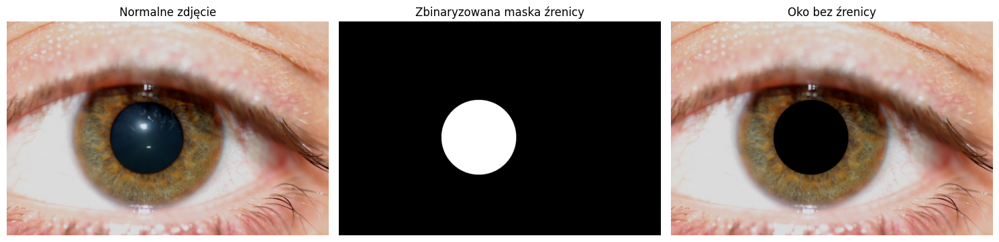

In [17]:
rgb = cv2.cvtColor(cv2.imread("te_ok/IMG_028_L_1.jpg"), cv2.COLOR_BGR2RGB)

# Konwersja do skali szarości
gray = grayscale(rgb)

# Obliczenie maski źrenicy (ładny okrąg)
pupil_mask, score, center, radius = compute_pupil_best_mask(gray, verbose=True)

# Tworzenie sub-plotów
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 1. Normalne zdjęcie
axes[0].imshow(rgb)
axes[0].set_title("Normalne zdjęcie")
axes[0].axis("off")

# 2. Zbinaryzowana maska źrenicy (ładny okrąg)
axes[1].imshow(pupil_mask, cmap='gray')
axes[1].set_title("Zbinaryzowana maska źrenicy")
axes[1].axis("off")

# 3. Oko bez źrenicy (czarne koło zamiast źrenicy)
rgb_no_pupil = rgb.copy()
rgb_no_pupil[pupil_mask == 255] = [0, 0, 0]  # Można też np. zamazać tło itp.

axes[2].imshow(rgb_no_pupil)
axes[2].set_title("Oko bez źrenicy")
axes[2].axis("off")

# Wyświetlenie wszystkich
plt.tight_layout()
plt.show()

In [35]:
def visualize_results(original_image, mask, factor, operation_name):
    """Wizualizacja wyników operacji na obrazie."""
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    # 1. Pokazuje oryginalny obraz
    axes[0].imshow(original_image)
    axes[0].set_title(f"Oryginalny obraz")
    axes[0].axis("off")

    # 2. Pokazuje wynik operacji
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title(f"{operation_name} (factor={factor})")
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()

In [44]:


def test_eye_detection(image_paths, factors):
    for idx, path in enumerate(image_paths, 1):
        if not Path(path).exists():
            print(f"Warning: {path} not found – skipping")
            continue

        # Ładowanie obrazu
        rgb = cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB)
        gray = grayscale(rgb)

        # Wykrywanie źrenicy i jej maskowanie
        pupil_mask, _, pupil_center, pupil_radius = compute_pupil_best_mask(gray, verbose=True)

        # Tworzymy wersję obrazu bez źrenicy (maskujemy źrenicę na białą)
        rgb_no_pupil = rgb.copy()
        rgb_no_pupil[pupil_mask == 255] = [255, 255, 255]  # Maskujemy źrenicę na białą
        rgb_no_pupil_gray = grayscale(rgb_no_pupil)

        # Wykrywanie tęczówki - używamy wcześniej zidentyfikowanego środka i promienia źrenicy
        iris_mask, iris_score, _, _ = compute_iris_best_mask(gray, pupil_center, pupil_radius)

        # Tworzymy sub-ploty (1 wykres oryginalny, kolejne wykresy dla różnych faktorów)
        fig, axes = plt.subplots(1, len(factors) + 1, figsize=(15, 5))  # +1 dla oryginalnego obrazu

        # 1. Prawdziwy obraz z wykrytą tęczówką
        axes[0].imshow(rgb)
        axes[0].set_title("Original Image with Iris")
        axes[0].axis("off")

        # 2. Testowanie dla różnych wartości factor
        for i, factor in enumerate(factors):
            # Binarna maska
            mask = binarization(rgb_no_pupil_gray, factor)

            # Wykrywanie maski tęczówki dla danego faktora
            iris_mask_factor, _, _, _ = compute_iris_best_mask(gray, pupil_center, pupil_radius)

            # Rysowanie wyników
            axes[i + 1].imshow(iris_mask_factor, cmap='gray')
            axes[i + 1].set_title(f"Iris Mask (factor={factor})")
            axes[i + 1].axis("off")

        # Wyświetlenie wykresu
        plt.tight_layout()
        plt.show()


In [47]:
def compute_iris_best_mask(gray_img, pupil_center, pupil_radius, kernel_size=(5, 5), factors=None, verbose=False):
    if factors is None:
        factors = [i / 10 for i in range(5, 30, 3)]

    best_score = 0
    best_mask = None
    kernel = np.ones(kernel_size, np.uint8)

    # Tworzymy maskę wykluczającą źrenicę
    iris_region_mask = np.ones_like(gray_img, dtype=np.uint8)  # Załóżmy, że to cały obraz
    rr, cc = np.ogrid[:gray_img.shape[0], :gray_img.shape[1]]
    pupil_mask = (rr - pupil_center[1]) ** 2 + (cc - pupil_center[0]) ** 2 <= pupil_radius ** 2
    iris_region_mask[pupil_mask] = 0  # Usuwamy źrenicę z analizy

    # Zmodyfikowany sposób tworzenia maski dla tęczówki
    for f in factors:
        # Binarna maska na podstawie aktualnego czynnika
        raw = binarization(gray_img, factor=f)
        
        # Maskowanie na region wokół źrenicy
        raw = raw * iris_region_mask

        # Operacje morfologiczne
        opened = opening(raw, kernel)
        closed = closing(opened, kernel)
        lcc = largest_connected_component(closed)
        mask = (lcc * 255).astype(np.uint8)
        score = circularity_and_completeness(mask)

        if verbose:
            print(f"Score: {score:.4f} | Factor: {f}")

        if score > best_score:
            best_score = score
            best_mask = mask

    # Jeśli nie znaleźliśmy maski, zwróć pustą maskę
    if best_mask is None:
        return np.zeros_like(gray_img, dtype=np.uint8), 0, (0, 0), 0

    # Zwróć najlepszą maskę, wynik oraz środek
    return best_mask, best_score, pupil_center, pupil_radius


In [48]:
def test_eye_detection(image_paths, factors):
    for idx, path in enumerate(image_paths, 1):
        if not Path(path).exists():
            print(f"Warning: {path} not found – skipping")
            continue

        # Ładowanie obrazu
        rgb = cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB)
        gray = grayscale(rgb)

        # Wykrywanie źrenicy i jej maskowanie
        pupil_mask, _, pupil_center, pupil_radius = compute_pupil_best_mask(gray, verbose=True)

        # Tworzymy wersję obrazu bez źrenicy (maskujemy źrenicę na białą)
        rgb_no_pupil = rgb.copy()
        rgb_no_pupil[pupil_mask == 255] = [255, 255, 255]  # Maskujemy źrenicę na białą
        rgb_no_pupil_gray = grayscale(rgb_no_pupil)

        # Testowanie dla różnych wartości factor
        for factor in factors:
            # Binarna maska
            mask = binarization(rgb_no_pupil_gray, factor)

            # Wizualizacja wyników
            visualize_results(rgb_no_pupil, mask, factor, "Binarization Result")

        # Wykrywanie tęczówki - używamy wcześniej zidentyfikowanego środka i promienia źrenicy
        iris_mask, iris_score, _, _ = compute_iris_best_mask(gray, pupil_center, pupil_radius)

        # Wizualizacja maski tęczówki
        visualize_results(rgb, iris_mask, factor, "Iris Mask")


Score: 0.0157 | Factor: 2.9
Score: 0.1438 | Factor: 3.2
Score: 0.2409 | Factor: 3.5
Score: 0.4452 | Factor: 3.8
Score: 0.2156 | Factor: 4.1
Score: 0.1332 | Factor: 4.4
Score: 0.0310 | Factor: 4.7
Score: 0.0103 | Factor: 5.0
Score: 0.0195 | Factor: 5.3
Score: 0.0221 | Factor: 5.6
Score: 0.0987 | Factor: 5.9


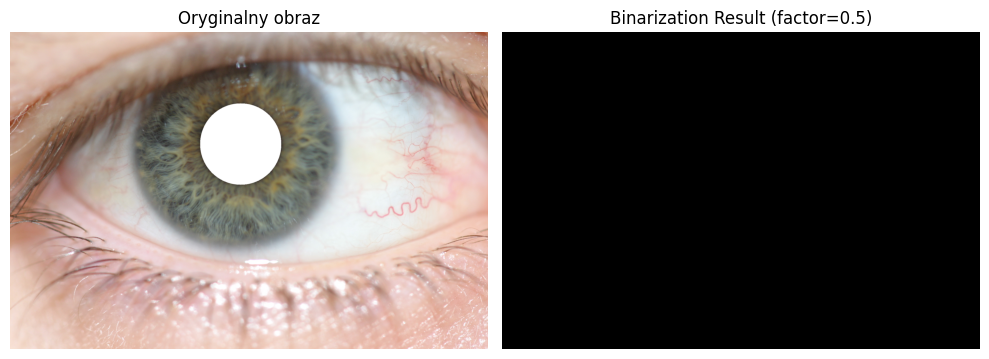

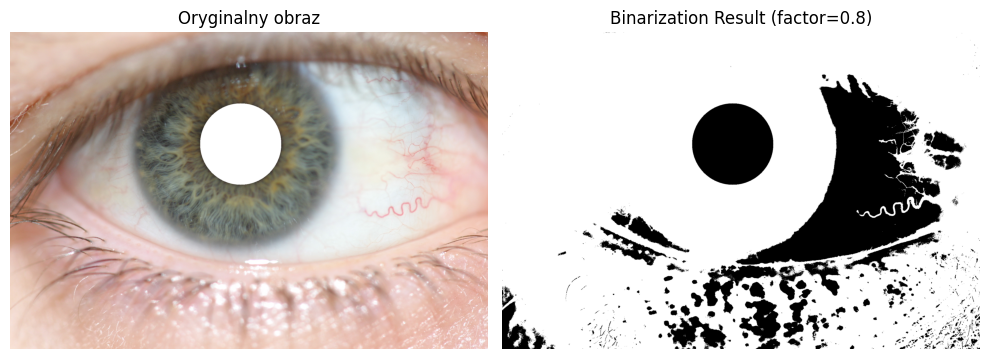

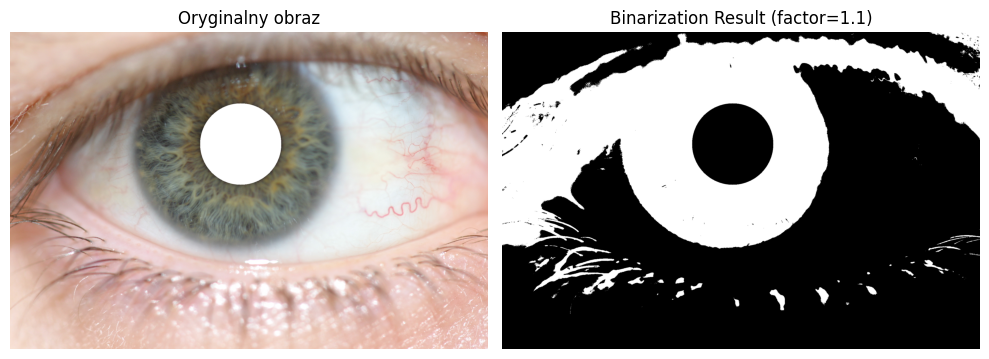

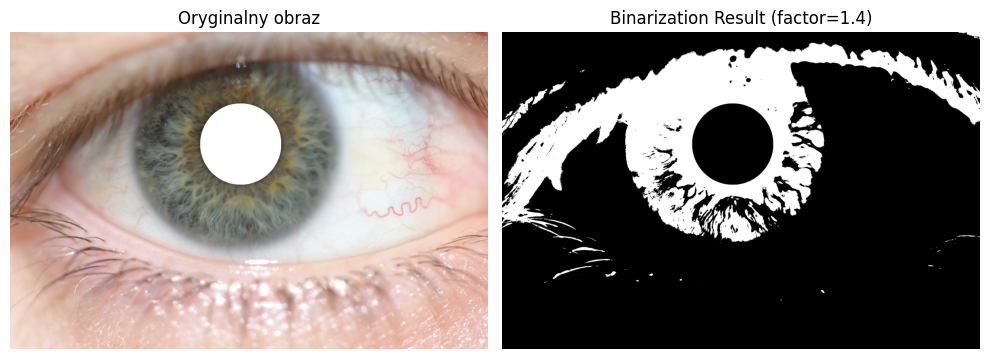

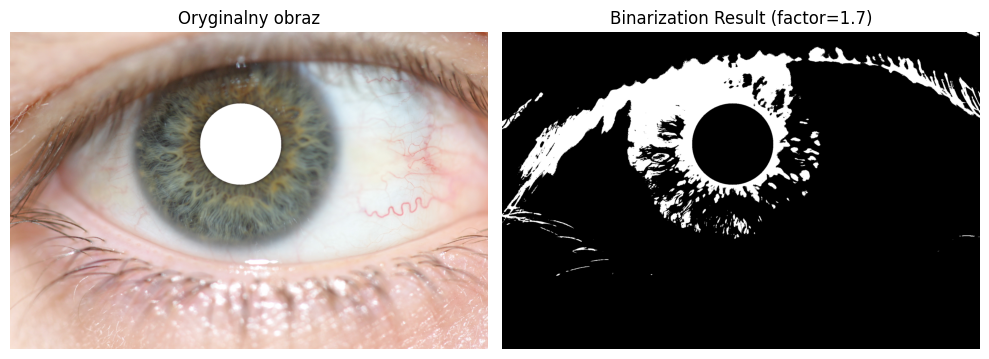

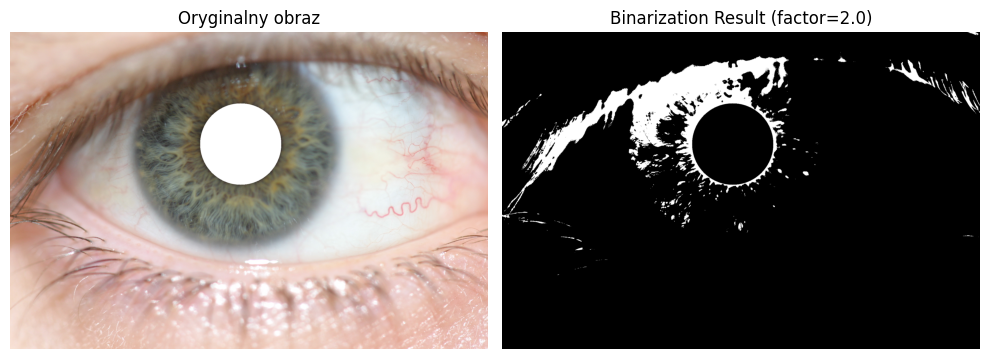

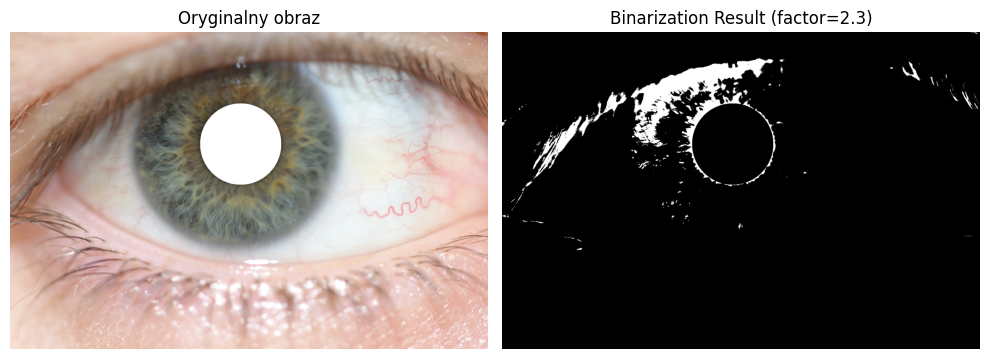

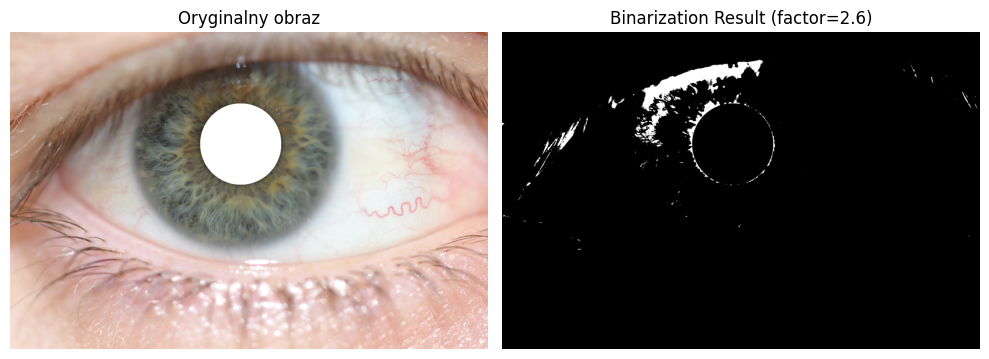

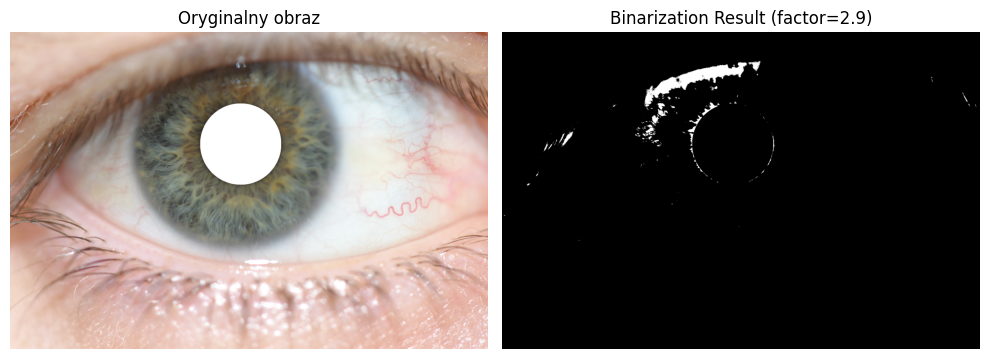

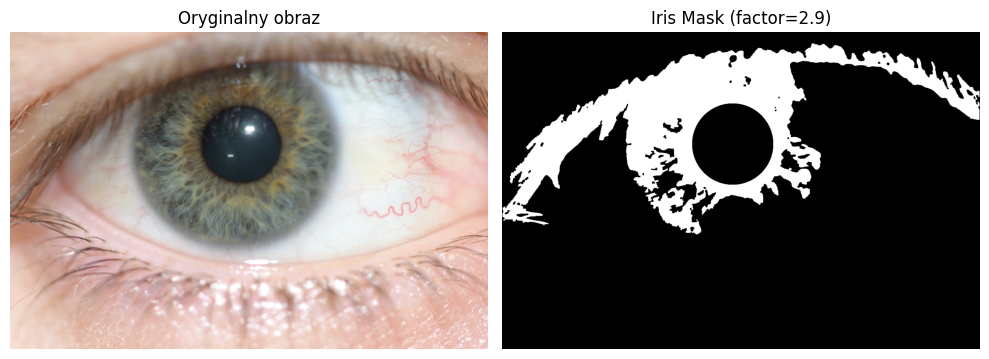

Score: 0.1190 | Factor: 2.9
Score: 0.1615 | Factor: 3.2
Score: 0.0759 | Factor: 3.5
Score: 0.2887 | Factor: 3.8
Score: 0.1385 | Factor: 4.1
Score: 0.2181 | Factor: 4.4
Score: 0.2163 | Factor: 4.7
Score: 0.2022 | Factor: 5.0
Score: 0.1112 | Factor: 5.3
Score: 0.2635 | Factor: 5.6
Score: 0.2141 | Factor: 5.9


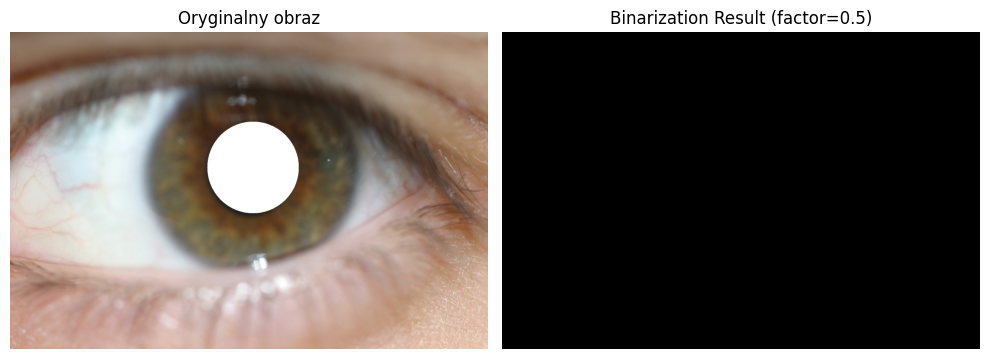

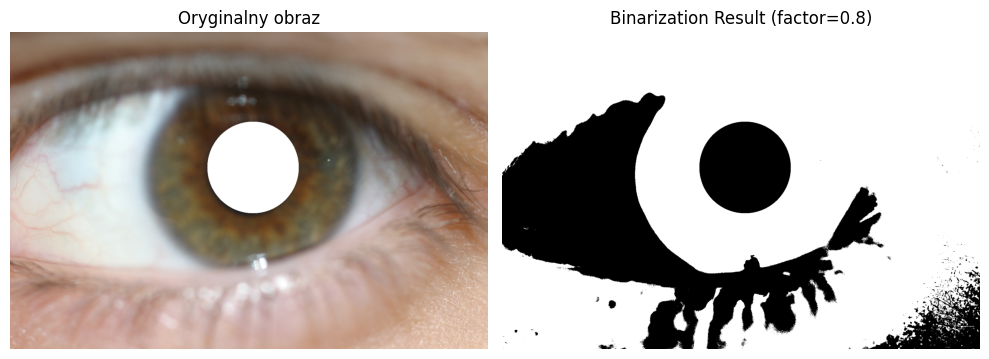

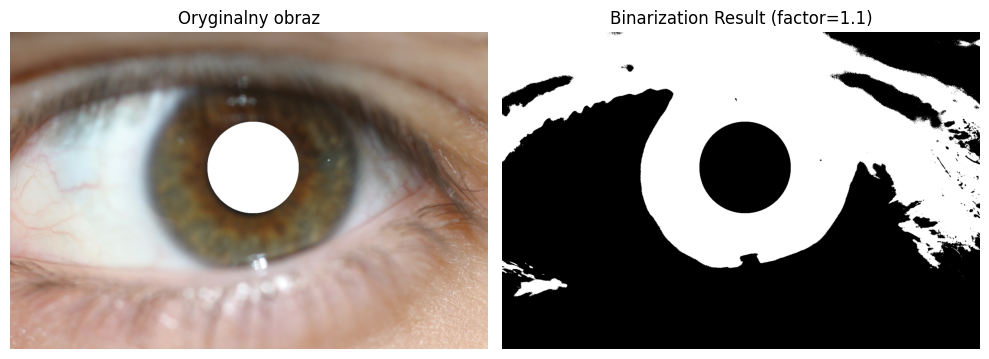

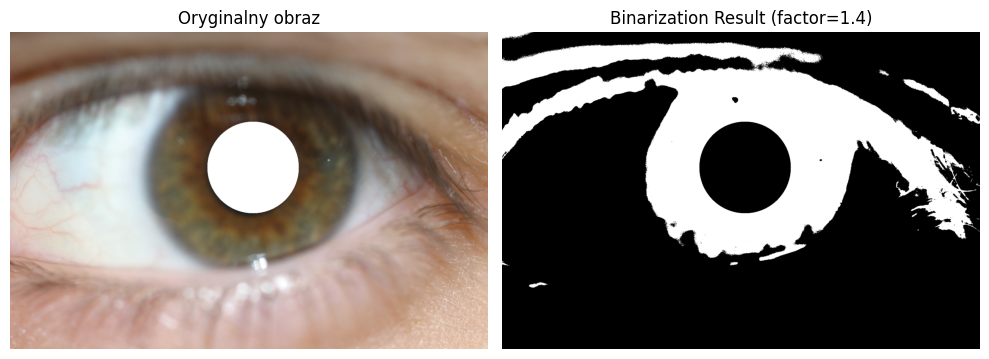

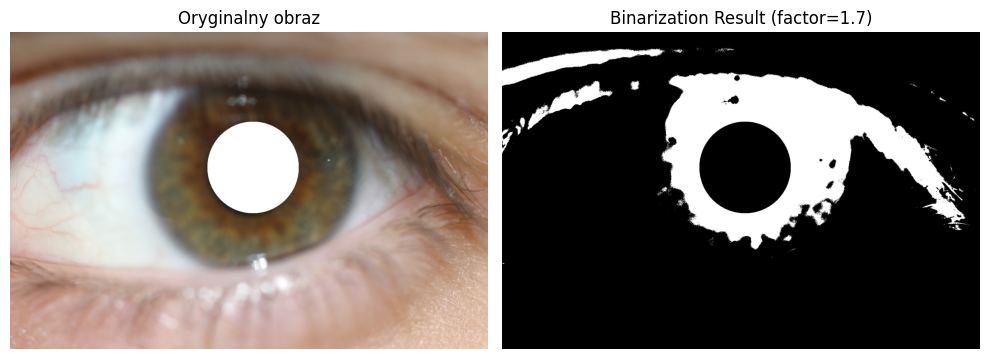

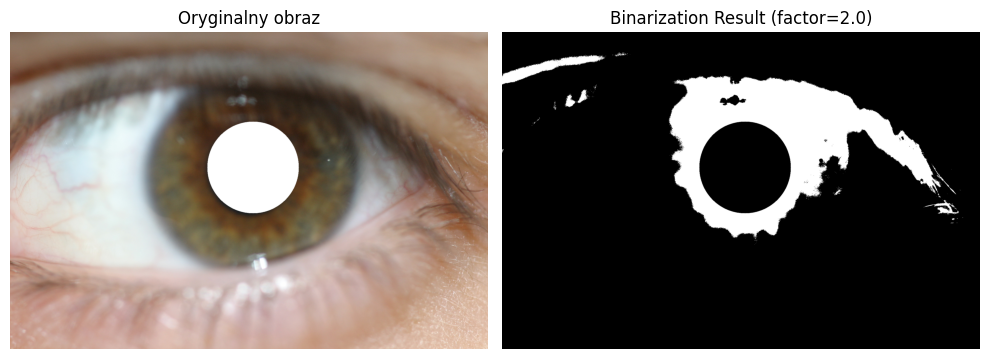

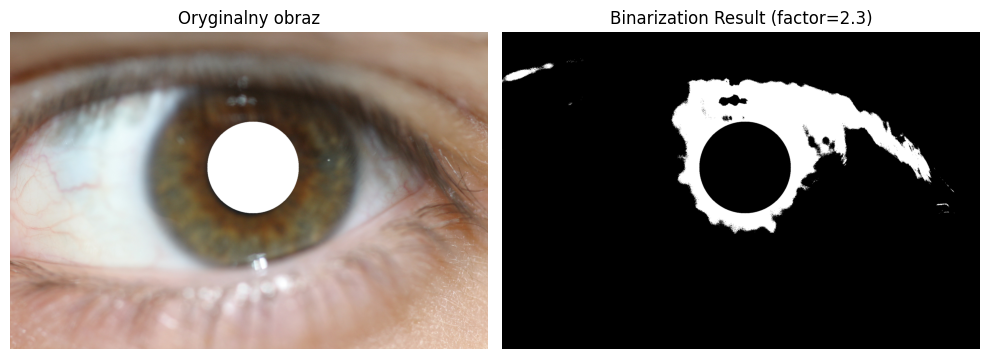

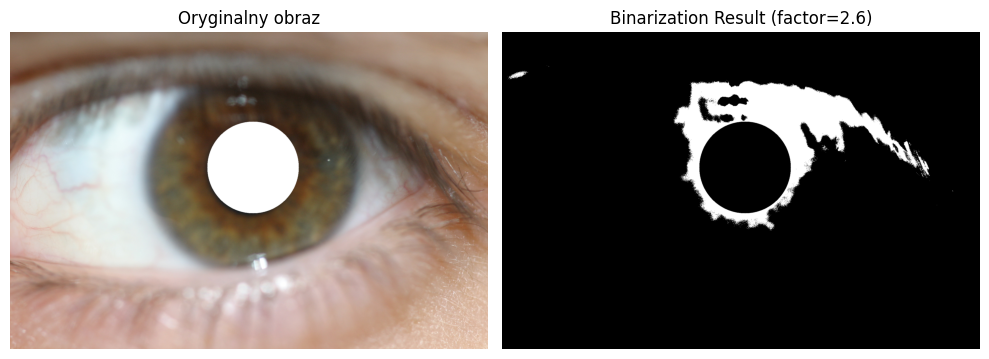

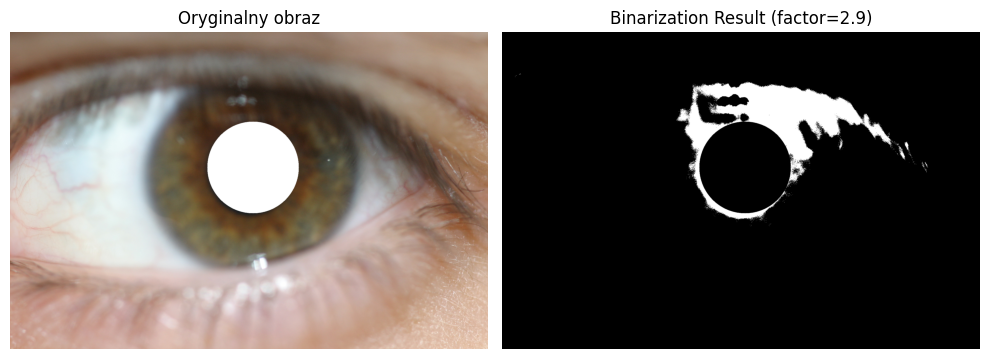

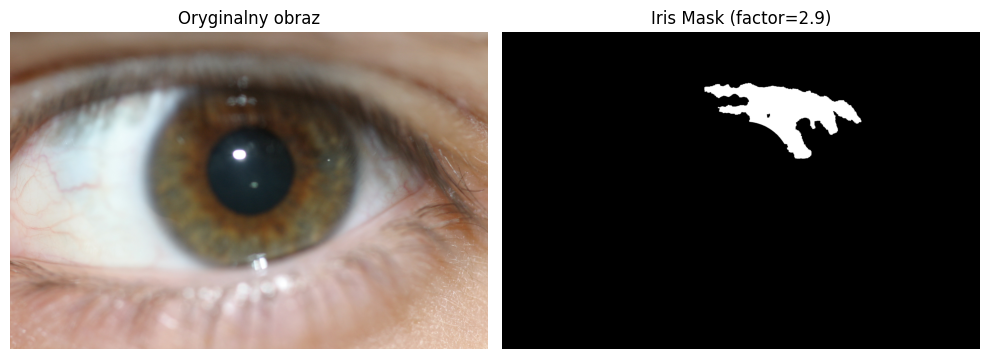

Score: 0.0032 | Factor: 2.9
Score: 0.0093 | Factor: 3.2
Score: 0.0181 | Factor: 3.5
Score: 0.0225 | Factor: 3.8
Score: 0.0240 | Factor: 4.1
Score: 0.0638 | Factor: 4.4
Score: 0.0749 | Factor: 4.7
Score: 0.0991 | Factor: 5.0
Score: 0.1126 | Factor: 5.3
Score: 0.4975 | Factor: 5.6
Score: 0.5944 | Factor: 5.9


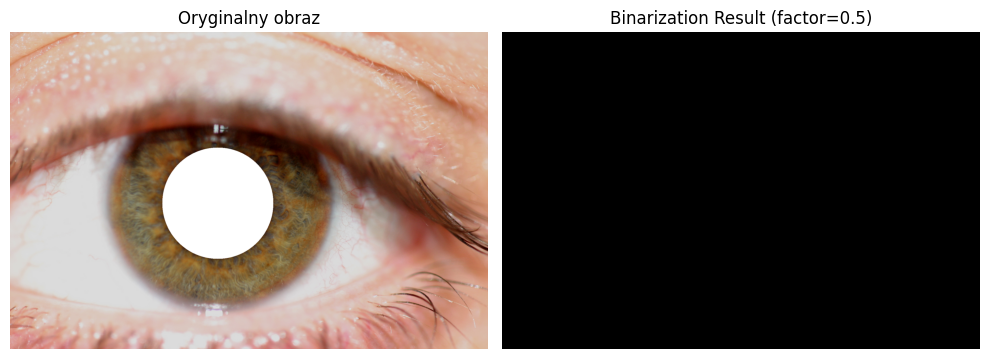

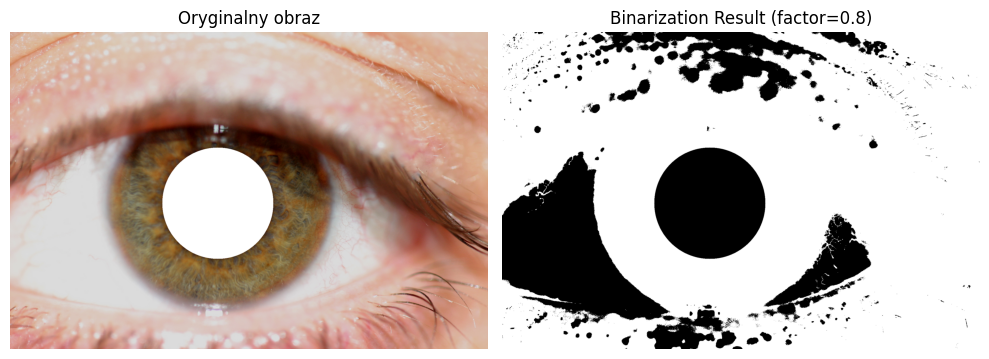

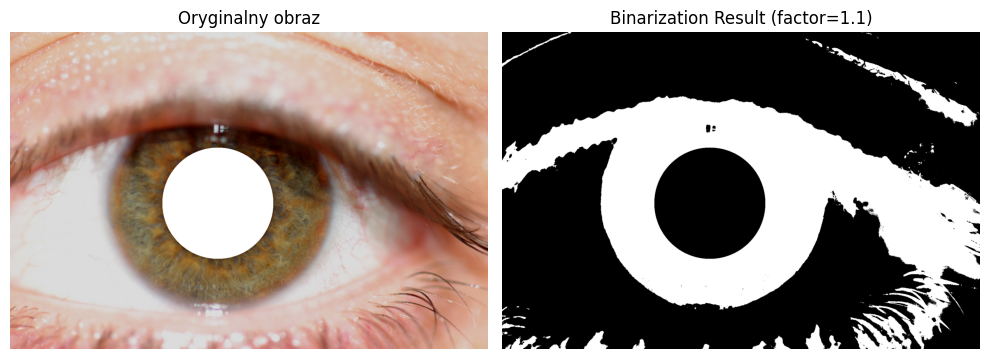

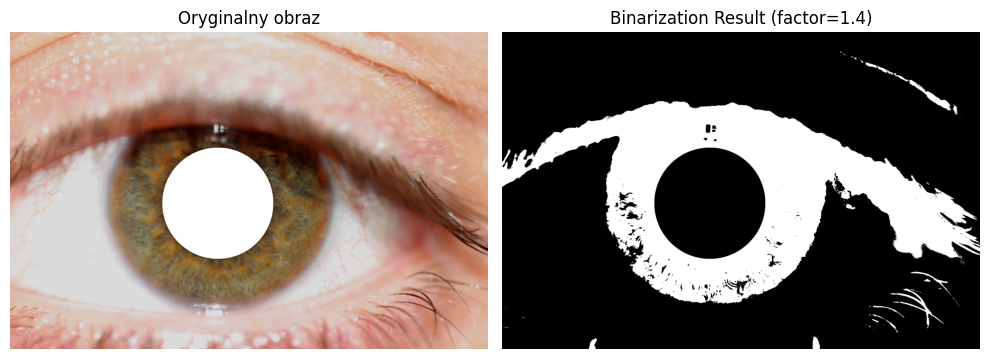

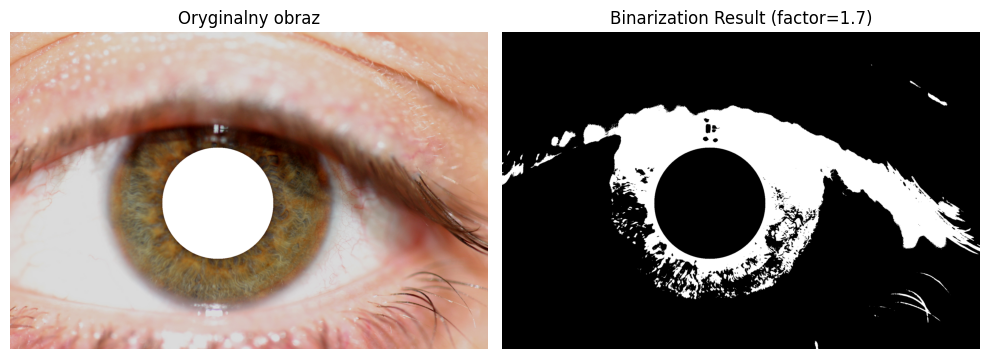

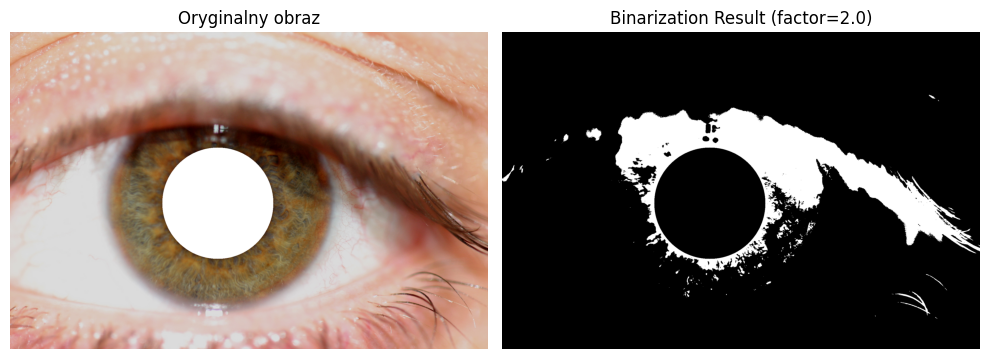

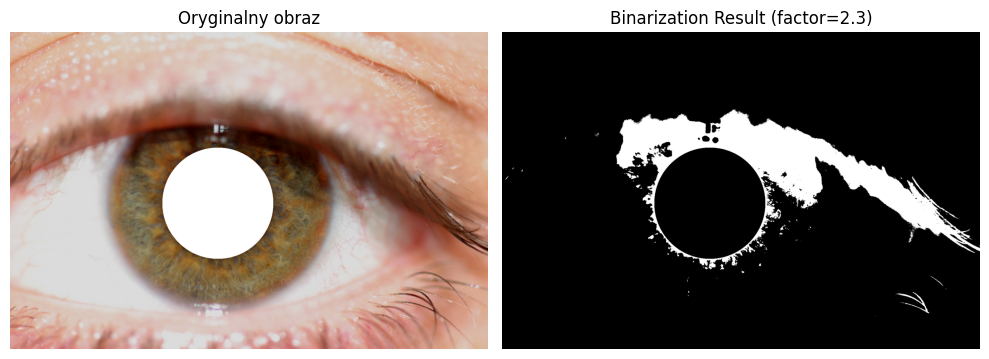

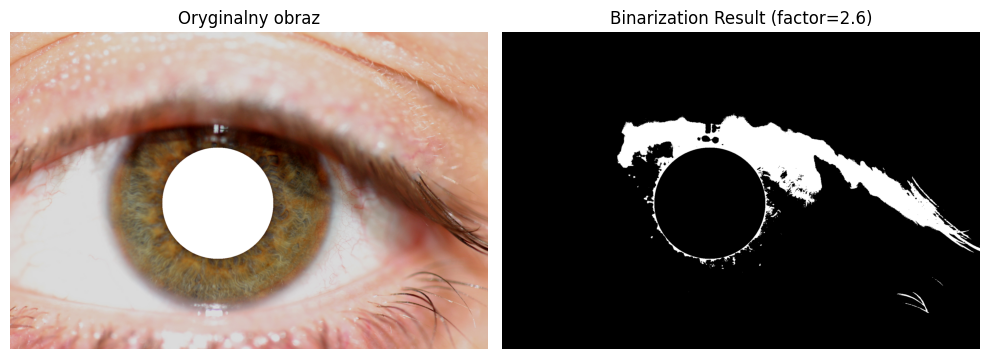

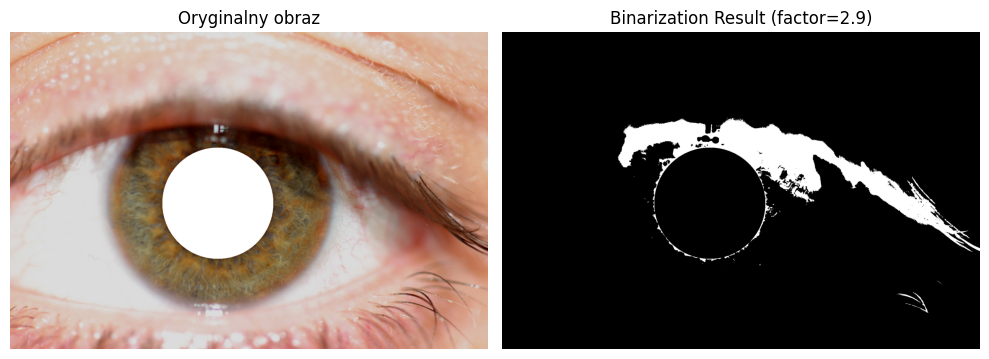

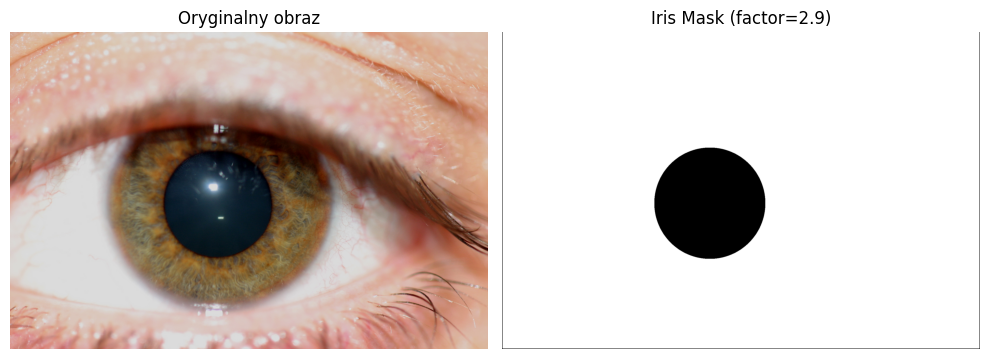

Score: 0.0869 | Factor: 2.9
Score: 0.1651 | Factor: 3.2
Score: 0.3328 | Factor: 3.5
Score: 0.3928 | Factor: 3.8
Score: 0.5726 | Factor: 4.1
Score: 0.0057 | Factor: 4.4
Score: 0.0127 | Factor: 4.7
Score: 0.0128 | Factor: 5.0
Score: 0.0605 | Factor: 5.3
Score: 0.0407 | Factor: 5.6
Score: 0.0350 | Factor: 5.9


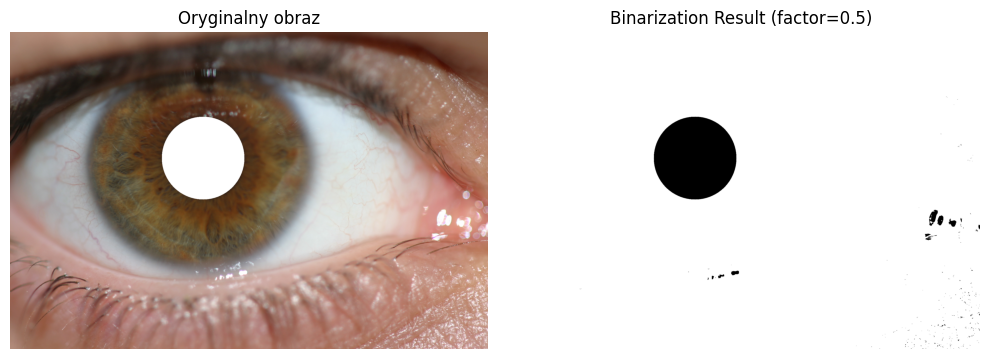

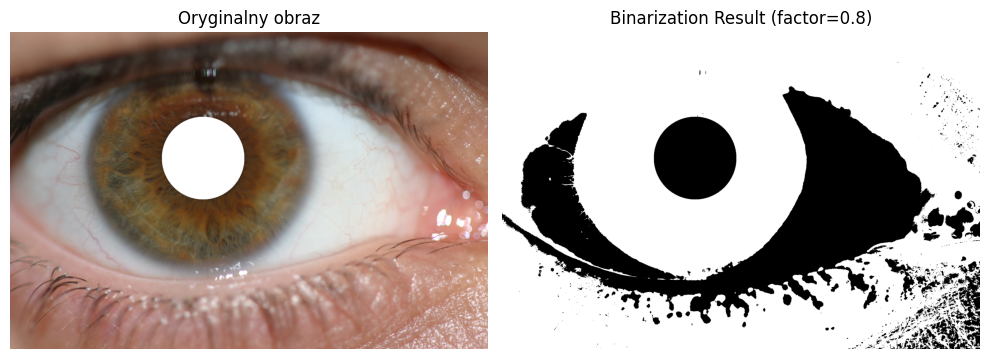

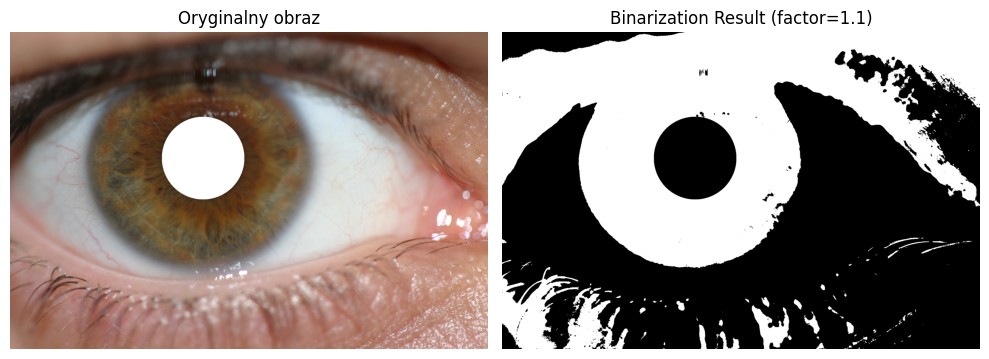

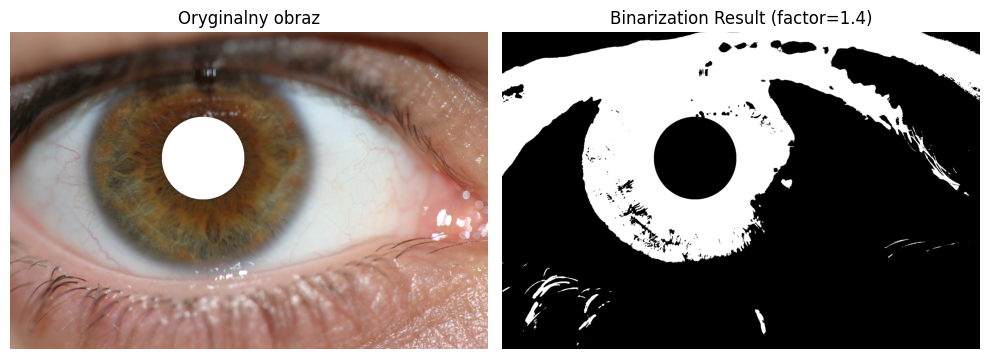

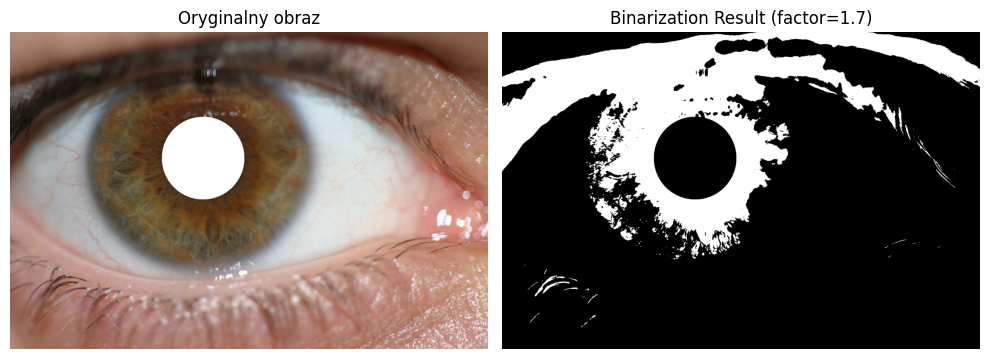

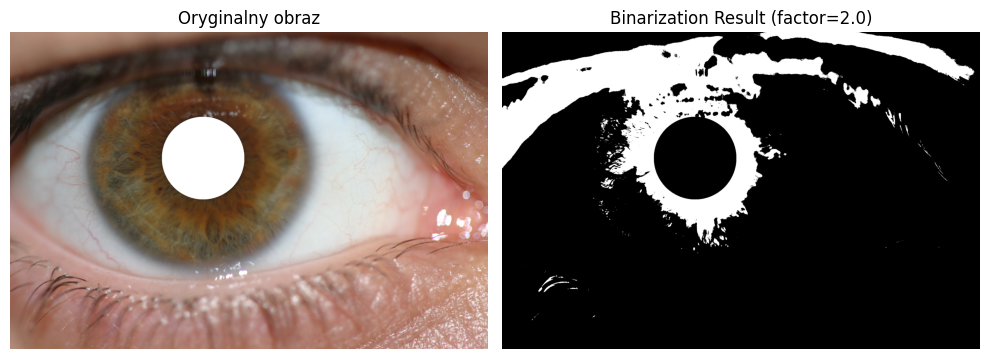

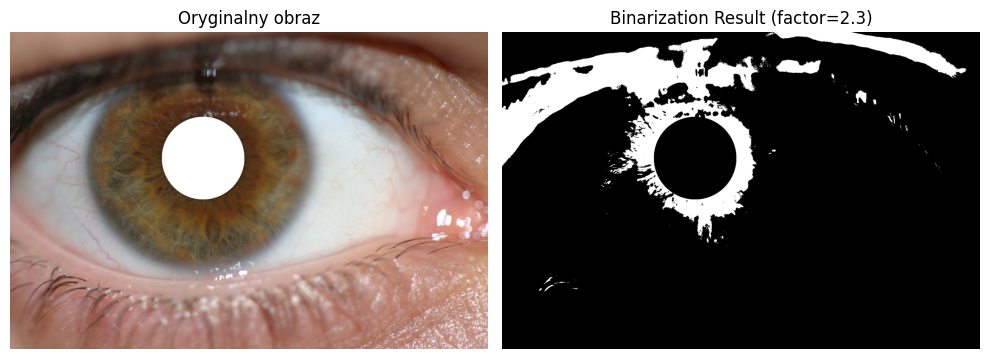

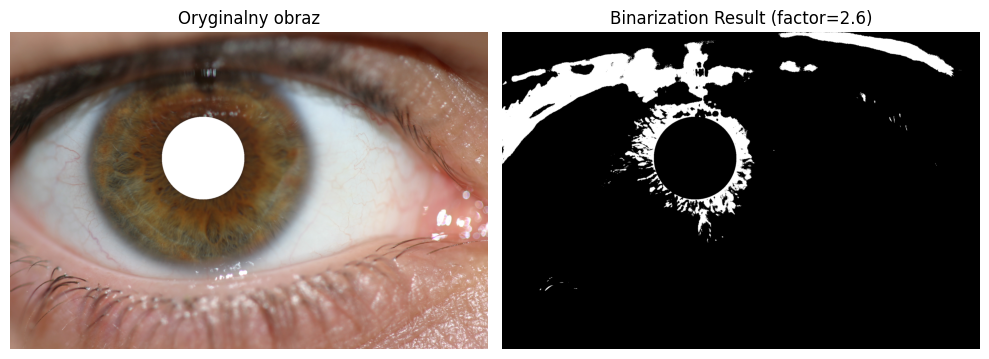

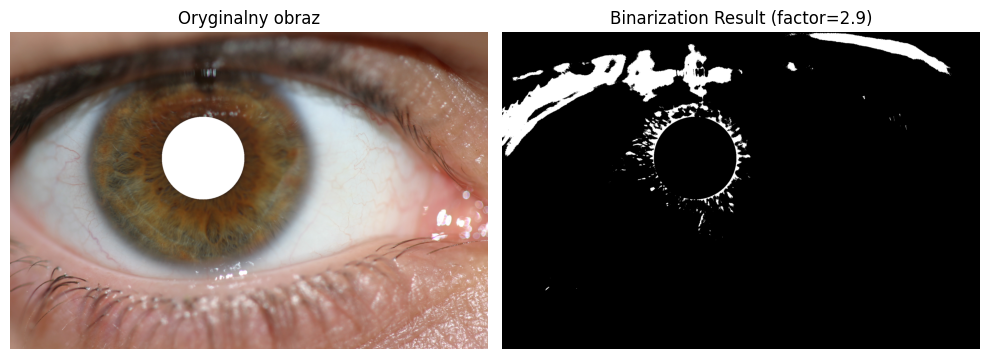

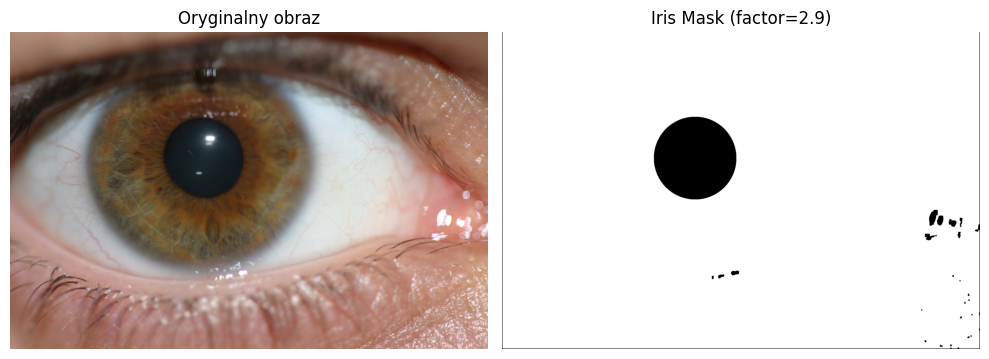

In [49]:
image_paths = list(Path("te_ok").rglob("*"))
factors = [i/10 for i in range(5, 30, 3)]

# Uruchomienie testu
test_eye_detection(image_paths, factors)